## Notes

## Setup / data check

In [112]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
from pathlib import Path
%matplotlib inline

Loading the data

In [113]:
df = pd.read_csv(Path.cwd().parent.joinpath("input", "data4x_norm.csv"))
print(f"Number of rows = {df.shape[0]}, number of cols = {df.shape[1]}")
df.head()

Number of rows = 287, number of cols = 17


,date,exp,imp,imae,crude_oil_brent,gas_henry_hub,treasury3month,yuan_dollar_spot_tc,usdollar_euro,ue_m,ue_x,usa_x,usa_m,chn_x,chn_m,year,month
0,1999-01-01,528.559625,539.682000,52.197280,11.114500,1.849474,4.335263,8.278921,1.159095,6.874581e+10,7.163649e+10,78473.0,94349.0,1.378254e+10,1.215118e+10,1999,1
1,1999-02-01,572.454746,531.069894,48.747353,10.271579,1.771053,4.438421,8.278137,1.120279,6.729938e+10,6.961722e+10,78212.0,96680.0,1.457695e+10,1.271262e+10,1999,2
2,1999-03-01,585.525887,599.843900,50.386924,12.511304,1.791739,4.440870,8.279152,1.088587,6.836457e+10,7.014471e+10,78701.0,96421.0,1.495095e+10,1.396941e+10,1999,3
3,1999-04-01,628.716318,489.165203,47.016367,15.294500,2.150000,4.289545,8.279186,1.070050,6.663455e+10,6.915344e+10,79530.0,97476.0,1.475300e+10,1.358823e+10,1999,4
4,1999-05-01,554.241723,518.387293,48.617007,15.225263,2.260000,4.498500,8.278535,1.063005,6.803258e+10,6.904065e+10,79539.0,99585.0,1.592297e+10,1.457009e+10,1999,5


Profile of variables

In [114]:
df.loc[:285, :]

,date,exp,imp,imae,crude_oil_brent,gas_henry_hub,treasury3month,yuan_dollar_spot_tc,usdollar_euro,ue_m,ue_x,usa_x,usa_m,chn_x,chn_m,year,month
0,1999-01-01,528.559625,539.682000,52.197280,11.114500,1.849474,4.335263,8.278921,1.159095,6.874581e+10,7.163649e+10,78473.0,94349.0,1.378254e+10,1.215118e+10,1999,1
1,1999-02-01,572.454746,531.069894,48.747353,10.271579,1.771053,4.438421,8.278137,1.120279,6.729938e+10,6.961722e+10,78212.0,96680.0,1.457695e+10,1.271262e+10,1999,2
2,1999-03-01,585.525887,599.843900,50.386924,12.511304,1.791739,4.440870,8.279152,1.088587,6.836457e+10,7.014471e+10,78701.0,96421.0,1.495095e+10,1.396941e+10,1999,3
3,1999-04-01,628.716318,489.165203,47.016367,15.294500,2.150000,4.289545,8.279186,1.070050,6.663455e+10,6.915344e+10,79530.0,97476.0,1.475300e+10,1.358823e+10,1999,4
4,1999-05-01,554.241723,518.387293,48.617007,15.225263,2.260000,4.498500,8.278535,1.063005,6.803258e+10,6.904065e+10,79539.0,99585.0,1.592297e+10,1.457009e+10,1999,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
281,2022-06-01,1363.141884,1767.376705,110.299335,122.710952,7.703333,1.494762,6.695190,1.056719,2.902293e+11,2.551306e+11,258763.0,339642.0,3.280593e+11,2.295157e+11,2022,6
282,2022-07-01,1294.293181,1789.115105,108.781981,111.925714,7.284500,2.232500,6.735155,1.016825,2.827161e+11,2.415047e+11,259585.0,330040.0,3.220420e+11,2.363655e+11,2022,7
283,2022-08-01,NaN,NaN,NaN,100.446364,8.805652,2.630870,6.800678,1.012878,2.966727e+11,2.487559e+11,260793.0,326472.0,3.028645e+11,2.212203e+11,2022,8
284,2022-09-01,NaN,NaN,NaN,89.764762,7.880476,3.126667,7.019514,0.989881,NaN,NaN,258004.0,331287.0,3.063312e+11,2.217532e+11,2022,9


Removing last two rows

In [115]:
df = df.loc[:282, :]
df.tail()

,date,exp,imp,imae,crude_oil_brent,gas_henry_hub,treasury3month,yuan_dollar_spot_tc,usdollar_euro,ue_m,ue_x,usa_x,usa_m,chn_x,chn_m,year,month
278,2022-03-01,1532.336765,2046.676435,118.039734,117.245217,4.898261,0.443478,6.344552,1.101852,2.724069e+11,2.509397e+11,244230.0,351148.0,3.057753e+11,2.174806e+11,2022,3
279,2022-04-01,1160.754061,1497.910195,107.455564,104.575263,6.596000,0.763000,6.431000,1.080295,2.858018e+11,2.495730e+11,251812.0,338520.0,2.840776e+11,2.293497e+11,2022,4
280,2022-05-01,1428.113760,1694.630314,110.021136,113.337619,8.144762,0.983333,6.698957,1.056719,2.868440e+11,2.557921e+11,254532.0,340385.0,3.129771e+11,2.323559e+11,2022,5
281,2022-06-01,1363.141884,1767.376705,110.299335,122.710952,7.703333,1.494762,6.695190,1.056719,2.902293e+11,2.551306e+11,258763.0,339642.0,3.280593e+11,2.295157e+11,2022,6
282,2022-07-01,1294.293181,1789.115105,108.781981,111.925714,7.284500,2.232500,6.735155,1.016825,2.827161e+11,2.415047e+11,259585.0,330040.0,3.220420e+11,2.363655e+11,2022,7


split data into train/validation/test. This a time series panel, so we should use a sequence split

In [116]:
train = 0.70
validation = 0.15
test = 0.15

In [117]:
from sklearn.model_selection import TimeSeriesSplit
tss = TimeSeriesSplit(n_splits=2, max_train_size=train*df.shape[0])
X = df.drop(["date", "exp"], axis=1)
y = df.loc[:, "exp"]

In [118]:
for train_index, test_index in tss.split(X):
    X_train, X_test = X.iloc[train_index], X.loc[test_index]
    y_train, y_test = y.iloc[train_index], y.loc[test_index]

In [119]:
X_train.tail()

,imp,imae,crude_oil_brent,gas_henry_hub,treasury3month,yuan_dollar_spot_tc,usdollar_euro,ue_m,ue_x,usa_x,usa_m,chn_x,chn_m,year,month
184,1372.226523,86.036981,109.539091,4.581905,0.032381,6.237957,1.373852,2.004304e+11,2.189680e+11,201418.0,240993.0,1.926675e+11,1.626247e+11,2014,5
185,1197.189889,85.360730,111.795238,4.587619,0.035714,6.230605,1.359486,2.026800e+11,2.204672e+11,200514.0,239410.0,1.864600e+11,1.614911e+11,2014,6
186,1256.756453,86.628677,106.768182,4.050909,0.026364,6.198436,1.353336,2.008949e+11,2.185756e+11,200758.0,239693.0,2.041776e+11,1.595445e+11,2014,7
187,1317.405927,86.174433,101.608095,3.912381,0.032857,6.154129,1.331524,1.952699e+11,2.133424e+11,202226.0,239161.0,1.980137e+11,1.625089e+11,2014,8
188,1304.498372,88.135780,97.091429,3.923810,0.020000,6.138229,1.288910,1.924613e+11,2.142373e+11,199556.0,241228.0,2.012506e+11,1.674984e+11,2014,9


In [120]:
X_test.head()

,imp,imae,crude_oil_brent,gas_henry_hub,treasury3month,yuan_dollar_spot_tc,usdollar_euro,ue_m,ue_x,usa_x,usa_m,chn_x,chn_m,year,month
189,1340.394752,92.546565,87.425217,3.781739,0.016818,6.125050,1.267732,1.858665e+11,2.091080e+11,201376.0,242443.0,2.029147e+11,1.640716e+11,2014,10
190,1277.510524,93.999684,79.437895,4.122632,0.021667,6.124894,1.247250,1.796310e+11,2.036963e+11,198893.0,238700.0,1.941337e+11,1.546442e+11,2014,11
191,1258.960825,95.226275,62.335000,3.481818,0.029091,6.188629,1.232919,1.761129e+11,2.054774e+11,198413.0,241251.0,1.978758e+11,1.540284e+11,2014,12
192,1142.030737,88.298983,47.759500,2.994500,0.027500,6.218135,1.161490,1.674467e+11,1.911057e+11,194245.0,233110.0,2.028528e+11,1.428091e+11,2015,1
193,1137.192892,90.035337,58.095500,2.874737,0.017895,6.251847,1.135026,1.684232e+11,1.910369e+11,191934.0,225837.0,2.462270e+11,1.387066e+11,2015,2


Splitting test into validation/test

In [121]:
vss = TimeSeriesSplit(n_splits= 2, max_train_size= int(np.ceil(0.5 * X_test.shape[0])))
X_test = X_test.reset_index()
y_test = y_test.reset_index()
for train_index1, test_index1 in vss.split(X_test):
    X_vali, X_test2 = X_test.iloc[train_index1], X_test.loc[test_index1]
    y_vali, y_test2 = y_test.iloc[train_index1], y_test.loc[test_index1]

In [122]:
X_vali = X_vali.drop("index", axis = 1)
X_test2 = X_test2.drop("index", axis = 1)
y_vali = y_vali.drop("index", axis = 1)
y_test2 = y_test2.drop("index", axis = 1)

In [123]:
profile = ProfileReport(X_train, title="X variables", dark_mode=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Model/testing

Loading some libraries

In [124]:
from sklearn.linear_model import SGDRegressor, Lasso, Ridge, ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV, learning_curve
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error

Creating a fun for error plot

In [125]:
def plot_learning_curve(model,
                        xtrain, ytrain,
                        train_sizes_param=np.linspace(0.01, 1.0, 40),
                        cv_param=5
                        ):
    train_sizes, train_scores, valid_scores = learning_curve(
    model, xtrain, ytrain, train_sizes=train_sizes_param, cv=cv_param,
    scoring="neg_root_mean_squared_error")
    train_errors = -train_scores.mean(axis=1)
    valid_errors = -valid_scores.mean(axis=1)
    fig = plt.figure()
    plt.plot(train_sizes, train_errors, "r-+", linewidth=2, label="train")
    plt.plot(train_sizes, valid_errors, "b-", linewidth=3, label="valid")
    plt.legend(loc="upper left")
    plt.axis('on')
    plt.close()
    return fig

models

In [126]:
pipelines = {
    'ls' : make_pipeline(StandardScaler(), PolynomialFeatures(degree=4, include_bias=False), Lasso()),
    'rd' : make_pipeline(StandardScaler(), PolynomialFeatures(degree=4, include_bias=False), Ridge()),
    'en' : make_pipeline(StandardScaler(), PolynomialFeatures(degree=4, include_bias=False), ElasticNet()),
    'rf' : make_pipeline(StandardScaler(), PolynomialFeatures(degree=4, include_bias=False), RandomForestRegressor()),
    'gb' : make_pipeline(StandardScaler(), PolynomialFeatures(degree=4, include_bias=False), GradientBoostingRegressor())
}

grid

In [127]:
grid = {
    'ls' : {'lasso__alpha' : [0.1, 0.5, 0.6]},
    'rd' : {'ridge__alpha' : [0.1, 0.5, 0.6]},
    'en' : {'elasticnet__alpha' : [0.1, 0.5], 'elasticnet__l1_ratio': [0.8, 0.9, 1], 'elasticnet__max_iter' : [2000]},
    'rf' : {'randomforestregressor__n_estimators': [180, 200, 250]},
    'gb' : {'gradientboostingregressor__n_estimators': [180, 200, 250]}
}

running models

In [128]:
fit_models = {}
for k, v in pipelines.items():
    print(f"Runnning model: {k}")
    model = GridSearchCV(v, grid[k], n_jobs=-1, cv=10)
    fit_models[k] = model.fit(X_train, y_train)

Runnning model: ls


c:\Documentos\proyectos\xm4ecast\env\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.485e+02, tolerance: 3.958e+02
  model = cd_fast.enet_coordinate_descent(


Runnning model: rd
Runnning model: en
Runnning model: rf
Runnning model: gb


Viewing the best model

In [129]:
def model_check(modelname, model, roundn = 1):
    yhat_train = model.predict(X_train)
    yhat_test = model.predict(X_vali)
    mse_train = mean_squared_error(y_train, yhat_train)
    mse_test = mean_squared_error(y_vali, yhat_test)
    rmse_train = np.round(np.sqrt(mse_train), roundn)
    rmse_test = np.round(np.sqrt(mse_test), roundn)
    print(f"the model {modelname} has an rmse for train dataset: {rmse_train}, for the valid test is: {rmse_test}" )

Check values

In [130]:
for k, v in fit_models.items():
    model_check(k, v, 1)

the model ls has an rmse for train dataset: 16.7, for the valid test is: 140.3
the model rd has an rmse for train dataset: 3.8, for the valid test is: 656.5
the model en has an rmse for train dataset: 16.7, for the valid test is: 143.0
the model rf has an rmse for train dataset: 16.5, for the valid test is: 237.2
the model gb has an rmse for train dataset: 1.2, for the valid test is: 215.6


In [131]:
fit_models["en"].best_estimator_

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('polynomialfeatures',
                 PolynomialFeatures(degree=4, include_bias=False)),
                ('elasticnet',
                 ElasticNet(alpha=0.5, l1_ratio=1, max_iter=2000))])

Creating the error curve for the best model

c:\Documentos\proyectos\xm4ecast\env\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
c:\Documentos\proyectos\xm4ecast\env\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.556e+00, tolerance: 1.227e+00
  model = cd_fast.enet_coordinate_descent(
c:\Documentos\proyectos\xm4ecast\env\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisati

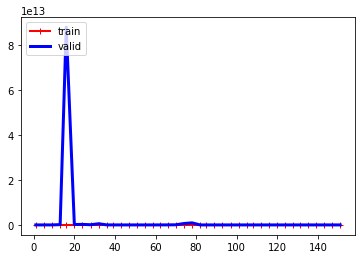

In [132]:
plot_learning_curve(fit_models["en"].best_estimator_, X_train, y_train)

We select the two best model an create an hyper parameter grid

In [158]:
pipelines2 = {
    # 'rf' : make_pipeline(StandardScaler(), PolynomialFeatures(degree=1, include_bias=False), RandomForestRegressor()),
    'en' : make_pipeline(StandardScaler(), PolynomialFeatures(degree=1, include_bias=True), ElasticNet()),
    'gb' : make_pipeline(StandardScaler(), PolynomialFeatures(degree=1, include_bias=True), GradientBoostingRegressor())
}
grid2 = {
    # 'rf' : {
    #         'randomforestregressor__n_estimators': [180, 200, 250, 300],
    #         'randomforestregressor__max_depth': [3, 4, 5, 6, 7],
    #         'randomforestregressor__max_features': ['sqrt', 'log2'],
    #         'randomforestregressor__max_leaf_nodes' : [2, 3, 4, 5]
    #         },
    'en' : {
            'elasticnet__alpha': [1, 2, 3, 4, 5, 6],
            'elasticnet__fit_intercept' : [True, False],
            'elasticnet__l1_ratio': [0, 0.2, 0.5, 0.8, 1],
            'elasticnet__max_iter' : [1000, 2000, 3000]
    },
    'gb' : {
            'gradientboostingregressor__n_estimators': [250, 300, 350, 400, 500, 600],
            'gradientboostingregressor__learning_rate': [0.1, 0.2, 0.3, 0.4],
            'gradientboostingregressor__max_depth' : [3, 4, 5, 6, 7],
            'gradientboostingregressor__max_features': ['log2'],
            'gradientboostingregressor__max_leaf_nodes' : [2, 3, 4, 5, 6, 7, 8]
            }
}

In [159]:
fit_models2 = {}
for k, v in pipelines2.items():
    print(f"Runnning model: {k}")
    model = GridSearchCV(v, grid2[k], n_jobs=-1, cv=5)
    fit_models2[k] = model.fit(X_train, y_train)

Runnning model: en
Runnning model: gb


In [160]:
for k, v in fit_models2.items():
    model_check(k, v, 1)

the model en has an rmse for train dataset: 53.2, for the valid test is: 177.6
the model gb has an rmse for train dataset: 1.2, for the valid test is: 156.7


In [164]:
fit_models2['gb'].best_params_

{'gradientboostingregressor__learning_rate': 0.2,
 'gradientboostingregressor__max_depth': 3,
 'gradientboostingregressor__max_features': 'log2',
 'gradientboostingregressor__max_leaf_nodes': 4,
 'gradientboostingregressor__n_estimators': 400}

In [169]:
yhat = fit_models2['en'].predict(X_test2)
np.sqrt(mean_squared_error(y_test2, yhat))

383.04139308060917